In [1]:

using DifferentialEquations
using Plots
using ForwardDiff
using NLsolve
using BenchmarkTools
using DataFrames
using Parameters
using LaTeXStrings

In [ ]:
# Hodgkin-Huxley parameter struct
@with_kw mutable struct CFiberParams
    # Capacitance
    C_m::Float64 = 1.0  # μF/cm²
    
    # Maximal conductances (mS/cm²) - parent axon values from Table 2
    gNav17::Float64 = 106.6439
    gNav18::Float64 = 242.7124
    gNav19::Float64 = 0.0948
    gKdr::Float64 = 18.0017
    gKA::Float64 = 12.7555
    gKM::Float64 = 6.9733
    gh::Float64 = 2.5377
    gKNa::Float64 = 0.0012
    gLeak::Float64 = 0.1  # Will be calculated for balance
    
    # Reversal potentials (mV) - will be calculated from Nernst
    ENa::Float64 = 62.0   # Approximate
    EK::Float64 = -90.0   # Approximate
    Eh::Float64 = -45.0   # Mixed Na/K channel
    
    # Pump parameters
    gpump::Float64 = 0.0048
    

    
    # Temperature
    T::Float64 = 37.0  # Body temperature
    Tfac_Na::Float64 = temperature_factor(20.0, 37.0, Q10_Na)
    Tfac_K::Float64 = temperature_factor(20.0, 37.0, Q10_K)
    Tfac_H::Float64 = temperature_factor(20.0, 37.0, Q10_H)
    
    # Ion concentrations (mM)
    Nain::Float64 = 11.4
    Naout::Float64 = 154.0
    Kin::Float64 = 121.7
    Kout::Float64 = 5.6

    # Stimulation current
    I_stim::Float64 = 100.0
    I_base::Float64 = 0.0
end

CFiberParams

In [3]:
# Main temperature-dependent HH ODE system 

function cfiber_hh!(du, u, p::CFiberParams, t)
    v = u[1]
    
    m17, h17, s17 = u[2], u[3], u[4]
    
    m18, h18, s18, u18 = u[5], u[6], u[7], u[8]
    
    m19, h19, s19 = u[9], u[10], u[11]
    
    nKdr = u[12]
    nKA, hKA = u[13], u[14]
    ns_KM, nf_KM = u[15], u[16]
    ns_h, nf_h = u[17], u[18]
    
    INa17 = p.gNav17 * m17^3 * h17 * s17 * (v - p.ENa)
    INa18 = p.gNav18 * m18^3 * h18 * s18 * u18 * (v - p.ENa)
    INa19 = p.gNav19 * m19 * h19 * s19 * (v - p.ENa)
    
    IKdr = p.gKdr * nKdr^4 * (v - p.EK)
    IKA = p.gKA * nKA * hKA * (v - p.EK)
    IKM = p.gKM * (ns_KM^(1/4) * nf_KM^(3/4)) * (v - p.EK)  #
    Ih = p.gh * 0.5 * (ns_h + nf_h) * (v - p.Eh)
    
    IKNa = p.gKNa * KNa_w(p.Nain) * (v - p.EK)
    
    ILeak = p.gLeak * (v - p.EK)
    
    du[1] = (-(INa17 + INa18 + INa19) - 
             (IKdr + IKA + IKM + IKNa) - 
             Ih - ILeak + 
             p.I_stim + p.I_base * 0.0) / p.C_m
    
    # NaV1.7 gating variables
    du[2] = p.Tfac_Na * (Nav17_m_inf(v) - m17) / Nav17_m_tau(v)
    du[3] = p.Tfac_Na * (Nav17_h_inf(v) - h17) / Nav17_h_tau(v)
    du[4] = p.Tfac_Na * (Nav17_s_inf(v) - s17) / Nav17_s_tau(v)
    
    # NaV1.8 gating variables
    du[5] = p.Tfac_Na * (Nav18_m_inf(v) - m18) / Nav18_m_tau(v)
    du[6] = p.Tfac_Na * (Nav18_h_inf(v) - h18) / Nav18_h_tau(v)
    du[7] = p.Tfac_Na * (Nav18_s_inf(v) - s18) / Nav18_s_tau(v)
    du[8] = p.Tfac_Na * (Nav18_u_inf(v) - u18) / Nav18_u_tau(v)
    
    # NaV1.9 gating variables
    du[9] = p.Tfac_Na * (Nav19_m_inf(v) - m19) / Nav19_m_tau(v)
    du[10] = p.Tfac_Na * (Nav19_h_inf(v) - h19) / Nav19_h_tau(v)
    du[11] = p.Tfac_Na * (Nav19_s_inf(v) - s19) / Nav19_s_tau(v)
    
    # K channel gating variables
    du[12] = p.Tfac_K * (Kdr_n_inf(v) - nKdr) / Kdr_n_tau(v)
    du[13] = p.Tfac_K * (KA_n_inf(v) - nKA) / KA_n_tau(v)
    du[14] = p.Tfac_K * (KA_h_inf(v) - hKA) / KA_h_tau(v)
    du[15] = p.Tfac_K * (KM_n_inf(v) - ns_KM) / KM_ns_tau(v)
    du[16] = p.Tfac_K * (KM_n_inf(v) - nf_KM) / KM_nf_tau(v)
    
    # h channel gating variables
    du[17] = p.Tfac_H * (h_n_inf(v) - ns_h) / h_ns_tau(v)
    du[18] = p.Tfac_H * (h_n_inf(v) - nf_h) / h_nf_tau(v)
    
    nothing
end

cfiber_hh! (generic function with 1 method)

In [4]:
function Nav17_m_inf(v)
    return 1.0 / (1.0 + exp((v + 5.0) / -12.08))
end

function Nav17_m_tau(v)
    α = 15.5 / (1.0 + exp((v + 5.0) / -12.08))
    β = 35.2 / (1.0 + exp((v + 72.7) / 16.7))
    return 1.0 / (α + β)
end

function Nav17_h_inf(v)
    return 1.0 / (1.0 + exp((v + 122.35) / 15.29))
end

function Nav17_h_tau(v)
    α = 0.38685 / (1.0 + exp((v + 122.35) / 15.29))
    β = 0.00283 + (2.00283 / (1.0 + exp((v + 5.5266) / -12.70195)))
    return 1.0 / (α + β)
end

function Nav17_s_inf(v)
    return 1.0 / (1.0 + exp((v + 93.9) / 16.6))
end

function Nav17_s_tau(v)
    α = (0.00003 + 0.00092) / (1.0 + exp((v + 93.9) / 16.6))
    β = (132.05 + 132.05) / (1.0 + exp((v + 384.9) / -28.5))
    return 1.0 / (α + β)
end

function Nav18_m_inf(v)
    return 1.0 / (1.0 + exp((v + 1.159) / -13.95))
end

function Nav18_m_tau(v)
    α = 2.85 - (2.839 / (1.0 + exp((v + 1.159) / -13.95)))
    β = 7.6205 / (1.0 + exp((v + 46.463) / -8.8289))
    return 1.0 / (α + β)
end

function Nav18_h_inf(v)
    return 1.0 / (1.0 + exp((v + 32.2) / 4.0))
end

function Nav18_h_tau(v)
    τ = 1.218 + (42.043 * exp(-((v + 38.12)^2) / (2.0 * 15.192^2)))
    return τ
end

function Nav18_s_inf(v)
    return 1.0 / (1.0 + exp((v + 45.0) / 8.0))
end

function Nav18_s_tau(v)
    if v < -45.0
        τ = 0.001 + (5.4203 / (1.0 + exp((v + 79.816) / -16.269)))
    else
        τ = 0.001 + (5.0757 / (1.0 + exp((v + 15.968) / 11.542)))
    end
    return τ
end

function Nav18_u_inf(v)
    return 1.0 / (1.0 + exp((v + 51.0) / 8.0))
end

function Nav18_u_tau(v)
    if v < -51.0
        τ = 0.0002 + (2.0434 / (1.0 + exp((v + 67.499) / -19.51)))
    else
        τ = 0.0002 + (1.9952 / (1.0 + exp((v + 30.963) / 14.792)))
    end
    return τ
end

function Nav19_m_tau(v)
    α = 1.032 / (1.0 + exp((v + 6.99) / -14.87115))
    β = 5.79 / (1.0 + exp((v + 130.4) / 22.9))
    return α + β
end

function Nav19_m_inf(v)
    α = 1.032 / (1.0 + exp((v + 6.99) / -14.87115))
    τ = Nav19_m_tau(v)
    return α / τ
end

function Nav19_h_tau(v)
    α = 0.06435 / (1.0 + exp((v + 73.26415) / -3.71928))
    β = 0.13496 / (1.0 + exp((v + 10.27853) / 29.09334))
    return α + β
end

function Nav19_h_inf(v)
    α = 0.06435 / (1.0 + exp((v + 73.26415) / -3.71928))
    τ = Nav19_h_tau(v)
    return α / τ
end

function Nav19_s_tau(v)
    α = 0.00000016 * exp(v / 12.0)
    β = 0.0005 / (1.0 + exp((v + 32.0) / -23.0))
    return α + β
end

function Nav19_s_inf(v)
    α = 0.00000016 * exp(v / 12.0)
    τ = Nav19_s_tau(v)
    return α / τ
end

function Kdr_n_inf(v)
    return 1.0 / (1.0 + exp((v + 45.0) / -15.4))
end

function Kdr_n_tau(v)
    if v < -31.0
        τ = 1000.0 / (0.000688 * (1.0 + exp((v + 75.2) / -6.5)) + 
                      exp((v + 131.5) / -34.8))
    else
        τ = 0.16 + 0.8 * exp(-0.0267 * (v + 11.0))
    end
    return τ
end

function KA_n_inf(v)
    return 1.0 / (1.0 + exp((v + 5.4) / -15.0))
end

function KA_n_tau(v)
    τ = 0.25 + (10.04 / (exp((v + 24.672) / -34.82) + exp((v + 24.672) / 34.82)))
    return 16.44 * τ
end

function KA_h_inf(v)
    return 1.0 / (1.0 + exp((v + 49.9) / 15.0))
end

function KA_h_tau(v)
    τ = 20.0 + (50.0 / (exp((v + 40.0) / -40.0) + exp((v + 40.0) / 40.0)))
    return min(τ, 5.0)  # Max τ = 5 ms
end

function KM_n_inf(v)
    return 1.0 / (1.0 + exp((v + 30.0) / -6.0))
end

function KM_ns_tau(v)
    if v <= -60.0
        return 219.0
    else
        return 13.0 + v / 1000.0
    end
end

function KM_nf_tau(v)
    α = 0.00395 * exp((v + 30.0) / 40.0)
    β = 0.00395 * exp((v + 30.0) / -20.0)
    return 1.0 / (α + β)
end

function h_n_inf(v)
    return 1.0 / (1.0 + exp((v + 87.2) / 9.7))
end

function h_ns_tau(v)
    if v < -70.0
        return 300.0 + (542.0 / exp((v + 25.0) / -20.0))
    else
        return 2500.0 + (100.0 / exp((v + 240.0) / -50.0))
    end
end

function h_nf_tau(v)
    if v < -70.0
        return 140.0 + (50.0 / exp((v + 25.0) / -20.0))
    else
        return 250.0 + (12.0 / exp((v + 240.0) / -50.0))
    end
end

function KNa_w(Nain)
    return 1.0 / (1.0 + (38.7 / Nain)^3.5)
end

V_rest = -55.
Q10_Na = 2.5
Q10_K = 3.3
Q10_H = 3.0

temperature_factor(T_ref, T_actual, Q10) = Q10^((T_actual - T_ref) / 10.0)


temperature_factor (generic function with 1 method)

In [5]:
function initial_conditions(p::CFiberParams)
    v0 = V_rest
    return [
        v0,                        # 1: membrane potential
        Nav17_m_inf(v0),          # 2: NaV1.7 m
        Nav17_h_inf(v0),          # 3: NaV1.7 h
        Nav17_s_inf(v0),          # 4: NaV1.7 s
        Nav18_m_inf(v0),          # 5: NaV1.8 m
        Nav18_h_inf(v0),          # 6: NaV1.8 h
        Nav18_s_inf(v0),          # 7: NaV1.8 s
        Nav18_u_inf(v0),          # 8: NaV1.8 u
        Nav19_m_inf(v0),          # 9: NaV1.9 m
        Nav19_h_inf(v0),          # 10: NaV1.9 h
        Nav19_s_inf(v0),          # 11: NaV1.9 s
        Kdr_n_inf(v0),            # 12: Kdr n
        KA_n_inf(v0),             # 13: KA n
        KA_h_inf(v0),             # 14: KA h
        KM_n_inf(v0),             # 15: KM slow
        KM_n_inf(v0),             # 16: KM fast
        h_n_inf(v0),              # 17: h slow
        h_n_inf(v0)               # 18: h fast
    ]
end

initial_conditions (generic function with 1 method)

In [6]:
params = CFiberParams()
u0 = initial_conditions(params)
tspan = (0.0, 1000.0)

(0.0, 1000.0)

In [7]:
prob = ODEProblem(cfiber_hh!, u0, tspan, params)

ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
Non-trivial mass matrix: false
timespan: (0.0, 1000.0)
u0: 18-element Vector{Float64}:
 -55.0
   0.01568759825951531
   0.01207058484648956
   0.0875939256756205
   0.020641990444626616
   0.9966651926925867
   0.7772998611746911
   0.6224593312018546
   0.15938278122159402
   0.3651112498926043
   1.216103744217639e-5
   0.34313588192671246
   0.03534319018094752
   0.5841905229354074
   0.015267153880374444
   0.015267153880374444
   0.03490529738018542
   0.03490529738018542

In [8]:
sol = solve(prob, Tsit5(), saveat=0.01)

┌ Warning: Interrupted. Larger maxiters is needed. If you are using an integrator for non-stiff ODEs or an automatic switching algorithm (the default), you may want to consider using a method for stiff equations. See the solver pages for more details (e.g. https://docs.sciml.ai/DiffEqDocs/stable/solvers/ode_solve/#Stiff-Problems).
└ @ SciMLBase C:\Users\dlc\.julia\packages\SciMLBase\sYmAV\src\integrator_interface.jl:589


retcode: MaxIters
Interpolation: 1st order linear
t: 22908-element Vector{Float64}:
   0.0
   0.01
   0.02
   0.03
   0.04
   0.05
   0.06
   0.07
   0.08
   0.09
   ⋮
 228.99
 229.0
 229.01
 229.02
 229.03
 229.04
 229.05
 229.06
 229.07
u: 22908-element Vector{Vector{Float64}}:
 [-55.0, 0.01568759825951531, 0.01207058484648956, 0.0875939256756205, 0.020641990444626616, 0.9966651926925867, 0.7772998611746911, 0.6224593312018546, 0.15938278122159402, 0.3651112498926043, 1.216103744217639e-5, 0.34313588192671246, 0.03534319018094752, 0.5841905229354074, 0.015267153880374444, 0.015267153880374444, 0.03490529738018542, 0.03490529738018542]
 [-45.2809518070314, 0.018164896607588753, 0.012059974935452598, 0.053084237648910994, 0.02303284461370609, 0.9966507694923871, 0.7760356322800568, 0.6177671049488919, 0.17692690037031317, 0.36731773021696, 2.1342983643217578e-5, 0.34313641208895906, 0.03535788378135074, 0.5829738923007458, 0.015395217586737921, 0.015287628533036416, 0.03490518196313209

In [9]:
function calculate_currents(sol, p::CFiberParams)
    n_points = length(sol.t)

    # Initialize current arrays
    INa17 = zeros(n_points)
    INa18 = zeros(n_points)
    INa19 = zeros(n_points)
    IKdr = zeros(n_points)
    IKA = zeros(n_points)
    IKM = zeros(n_points)
    Ih = zeros(n_points)
    IKNa = zeros(n_points)
    ILeak = zeros(n_points)

    # Calculate currents at each time point
    for i in 1:n_points
        v = sol[1, i]
        m17, h17, s17 = sol[2, i], sol[3, i], sol[4, i]
        m18, h18, s18, u18 = sol[5, i], sol[6, i], sol[7, i], sol[8, i]
        m19, h19, s19 = sol[9, i], sol[10, i], sol[11, i]
        nKdr = sol[12, i]
        nKA, hKA = sol[13, i], sol[14, i]
        ns_KM, nf_KM = sol[15, i], sol[16, i]
        ns_h, nf_h = sol[17, i], sol[18, i]

        # Sodium currents
        INa17[i] = p.gNav17 * m17^3 * h17 * s17 * (v - p.ENa)
        INa18[i] = p.gNav18 * m18^3 * h18 * s18 * u18 * (v - p.ENa)
        INa19[i] = p.gNav19 * m19 * h19 * s19 * (v - p.ENa)

        # Potassium currents
        IKdr[i] = p.gKdr * nKdr^4 * (v - p.EK)
        IKA[i] = p.gKA * nKA * hKA * (v - p.EK)
        IKM[i] = p.gKM * (ns_KM^(1/4) * nf_KM^(3/4)) * (v - p.EK)

        # Other currents
        Ih[i] = p.gh * 0.5 * (ns_h + nf_h) * (v - p.Eh)
        IKNa[i] = p.gKNa * KNa_w(p.Nain) * (v - p.EK)
        ILeak[i] = p.gLeak * (v - p.EK)
    end

    # Return as named tuple for easy access
    return (
        t = sol.t,
        INa17 = INa17,
        INa18 = INa18,
        INa19 = INa19,
        INa_total = INa17 .+ INa18 .+ INa19,
        IKdr = IKdr,
        IKA = IKA,
        IKM = IKM,
        Ih = Ih,
        IKNa = IKNa,
        ILeak = ILeak,
        IK_total = IKdr .+ IKA .+ IKM .+ IKNa
    )
end

calculate_currents (generic function with 1 method)

In [10]:
function plot_complete_overview(sol, p::CFiberParams; stim_time=(5.0, 7.0))

    t = sol.t
    V = sol[1, :]

    # Calculate currents
    currents = calculate_currents(sol, p)

    # Create figure with 8 subplots
    fig = plot(layout=(4, 2), size=(1400, 1600), dpi=150,
               left_margin=10Plots.mm, bottom_margin=5Plots.mm)

    # Panel 1: Membrane Potential
    plot!(fig[1], t, V, linewidth=2.5, color=:black, label="V(t)",
          xlabel="", ylabel="Voltage (mV)",
          title="A) Membrane Potential", titlefontsize=11, legend=:topright,
          grid=true, gridstyle=:dot, gridalpha=0.3)
    vspan!(fig[1], [stim_time[1]], [stim_time[2]], alpha=0.1, color=:gray, label="Stimulus")
    hline!(fig[1], [-55.0], linestyle=:dash, color=:red, alpha=0.5, label="V_rest")

    # Panel 2: Sodium Channel Activation (m gates)
    plot!(fig[2], t, sol[2, :], linewidth=2, color=:green, label="m17 (NaV1.7)",
          xlabel="", ylabel="Activation (0-1)",
          title="B) Na Channel Activation", titlefontsize=11,
          grid=true, gridstyle=:dot, gridalpha=0.3)
    plot!(fig[2], t, sol[5, :], linewidth=2, color=:red, label="m18 (NaV1.8)")
    plot!(fig[2], t, sol[9, :], linewidth=2, color=:orange, label="m19 (NaV1.9)")
    vspan!(fig[2], [stim_time[1]], [stim_time[2]], alpha=0.05, color=:gray, label="")
    ylims!(fig[2], (-0.05, 1.05))

    # Panel 3: Sodium Channel Inactivation (h gates)
    plot!(fig[3], t, sol[3, :], linewidth=2, color=:green, label="h17",
          xlabel="", ylabel="Inactivation (0-1)",
          title="C) Na Channel Inactivation", titlefontsize=11,
          grid=true, gridstyle=:dot, gridalpha=0.3)
    plot!(fig[3], t, sol[6, :], linewidth=2, color=:red, label="h18")
    plot!(fig[3], t, sol[10, :], linewidth=2, color=:orange, label="h19")
    vspan!(fig[3], [stim_time[1]], [stim_time[2]], alpha=0.05, color=:gray, label="")
    ylims!(fig[3], (-0.05, 1.05))

    # Panel 4: Potassium Channel Gating
    plot!(fig[4], t, sol[12, :], linewidth=2, color=:blue, label="n_Kdr",
          xlabel="", ylabel="Gating (0-1)",
          title="D) K Channel Gating", titlefontsize=11,
          grid=true, gridstyle=:dot, gridalpha=0.3)
    plot!(fig[4], t, sol[13, :], linewidth=2, color=:cyan, label="n_KA")
    plot!(fig[4], t, sol[14, :], linewidth=2, color=:orange, label="h_KA")
    vspan!(fig[4], [stim_time[1]], [stim_time[2]], alpha=0.05, color=:gray, label="")
    ylims!(fig[4], (-0.05, 1.05))

    # Panel 5: Sodium Currents by Channel Type
    plot!(fig[5], t, currents.INa17, linewidth=2, color=:green, label="INa1.7",
          xlabel="", ylabel="Current (pA)",
          title="E) Na Currents by Type", titlefontsize=11,
          grid=true, gridstyle=:dot, gridalpha=0.3)
    plot!(fig[5], t, currents.INa18, linewidth=2, color=:red, label="INa1.8")
    plot!(fig[5], t, currents.INa19, linewidth=2, color=:orange, label="INa1.9")
    hline!(fig[5], [0], color=:black, linestyle=:dash, alpha=0.3, label="")
    vspan!(fig[5], [stim_time[1]], [stim_time[2]], alpha=0.05, color=:gray, label="")

    # Panel 6: Potassium Currents
    plot!(fig[6], t, currents.IKdr, linewidth=2, color=:blue, label="IKdr",
          xlabel="", ylabel="Current (pA)",
          title="F) K Currents", titlefontsize=11,
          grid=true, gridstyle=:dot, gridalpha=0.3)
    plot!(fig[6], t, currents.IKA, linewidth=2, color=:cyan, label="IKA")
    plot!(fig[6], t, currents.IKM, linewidth=2, color=:purple, label="IKM")
    hline!(fig[6], [0], color=:black, linestyle=:dash, alpha=0.3, label="")
    vspan!(fig[6], [stim_time[1]], [stim_time[2]], alpha=0.05, color=:gray, label="")

    # Panel 7: Total Na vs K Currents
    plot!(fig[7], t, currents.INa_total, linewidth=2.5, color=:red, label="INa (total)",
          xlabel="Time (ms)", ylabel="Current (pA)",
          title="G) Total Ionic Currents", titlefontsize=11,
          grid=true, gridstyle=:dot, gridalpha=0.3)
    plot!(fig[7], t, currents.IK_total, linewidth=2.5, color=:blue, label="IK (total)")
    hline!(fig[7], [0], color=:black, linestyle=:dash, alpha=0.3, label="")
    vspan!(fig[7], [stim_time[1]], [stim_time[2]], alpha=0.05, color=:gray, label="")

    # Panel 8: Net Current (approximates dV/dt)
    """net_current = currents.INa_total .+ currents.IK_total .+ currents.Ih .+ currents.ILeak
    dVdt = -net_current ./ p.C_m
    plot!(fig[8], t, dVdt, linewidth=2.5, color=:purple, label="dV/dt",
          xlabel="Time (ms)", ylabel="dV/dt (V/s)",
          title="H) Voltage Derivative", titlefontsize=11,
          grid=true, gridstyle=:dot, gridalpha=0.3)
    hline!(fig[8], [0], color=:black, linestyle=:dash, alpha=0.3, label="")
    vspan!(fig[8], [stim_time[1]], [stim_time[2]], alpha=0.05, color=:gray, label="")"""

    return fig
end

plot_complete_overview (generic function with 1 method)

In [11]:
function plot_phase_planes(sol, p::CFiberParams)
    """
    Phase plane portraits 
    """
    t = sol.t
    V = sol[1, :]

    fig = plot(layout=(2, 2), size=(1000, 1000), dpi=150,
               left_margin=8Plots.mm, bottom_margin=5Plots.mm)

    # Panel 1: V vs m18 (activation)
    scatter!(fig[1], sol[5, :], V, marker_z=t, markersize=3, alpha=0.6,
             color=:viridis, colorbar=true, colorbar_title="Time (ms)",
             xlabel="m18 (NaV1.8 activation)", ylabel="Voltage (mV)",
             title="A) Voltage vs Na Activation",
             grid=true, label="", markerstrokewidth=0)
    plot!(fig[1], sol[5, :], V, color=:black, alpha=0.2, linewidth=1, label="")

    # Panel 2: m18 vs h18 (activation-inactivation)
    scatter!(fig[2], sol[5, :], sol[6, :], marker_z=t, markersize=3, alpha=0.6,
             color=:plasma, colorbar=true, colorbar_title="Time (ms)",
             xlabel="m18 (activation)", ylabel="h18 (inactivation)",
             title="B) Na Activation-Inactivation Phase",
             grid=true, label="", markerstrokewidth=0)
    plot!(fig[2], sol[5, :], sol[6, :], color=:black, alpha=0.2, linewidth=1, label="")
    scatter!(fig[2], [sol[5, 1]], [sol[6, 1]], markersize=8, color=:green, 
             markershape=:circle, label="Start")
    scatter!(fig[2], [sol[5, end]], [sol[6, end]], markersize=8, color=:red,
             markershape=:square, label="End")

    # Panel 3: V vs n_Kdr (K activation)
    scatter!(fig[3], sol[12, :], V, marker_z=t, markersize=3, alpha=0.6,
             color=:cividis, colorbar=true, colorbar_title="Time (ms)",
             xlabel="n (Kdr activation)", ylabel="Voltage (mV)",
             title="C) Voltage vs K Activation",
             grid=true, label="", markerstrokewidth=0)
    plot!(fig[3], sol[12, :], V, color=:black, alpha=0.2, linewidth=1, label="")

    # Panel 4: Time series of key gating variables
    plot!(fig[4], t, sol[5, :], linewidth=2, color=:red, label="m18 (Na act)",
          xlabel="Time (ms)", ylabel="Gating Variable (0-1)",
          title="D) Key Gating Dynamics",
          grid=true, gridstyle=:dot, gridalpha=0.3,
          ylims=(-0.05, 1.05))
    plot!(fig[4], t, sol[6, :], linewidth=2, color=:blue, label="h18 (Na inact)")
    plot!(fig[4], t, sol[12, :], linewidth=2, color=:green, label="n_Kdr (K act)")

    return fig
end

plot_phase_planes (generic function with 1 method)

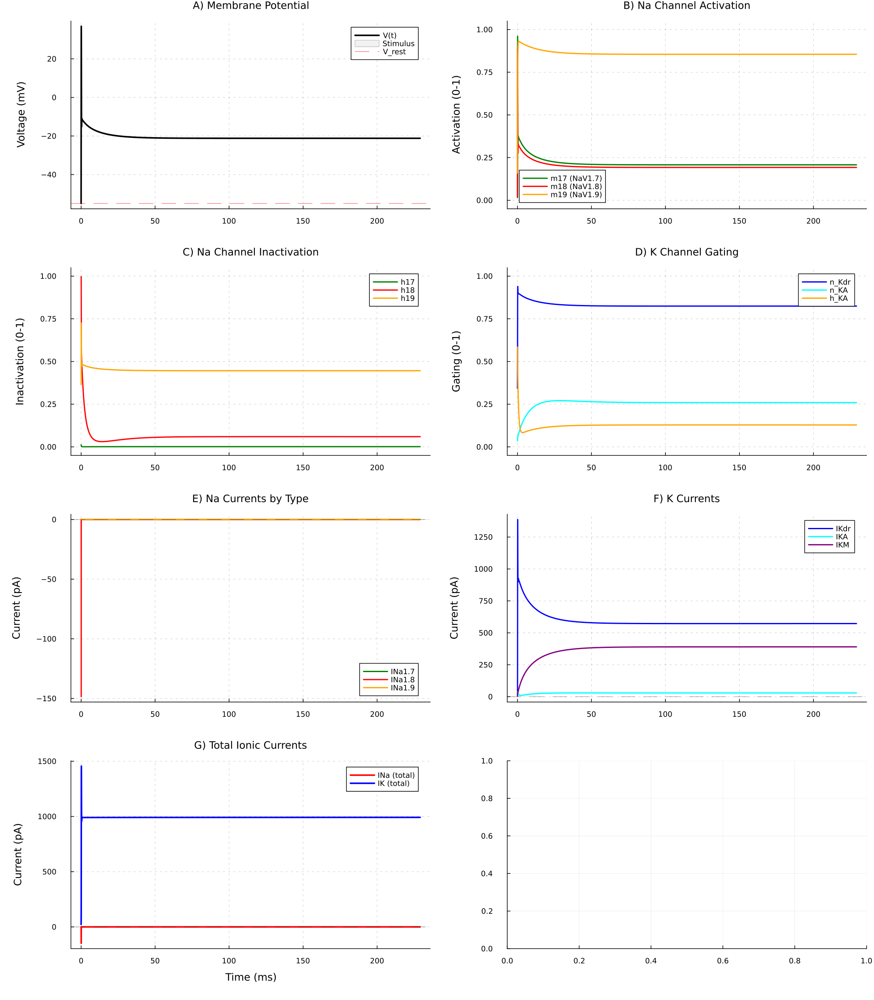

In [12]:
fig1 = plot_complete_overview(sol, params, stim_time=(5.0, 7.0))

In [13]:
"""# Define the problem
probODE = ODEProblem(hh!, u0, tspan, p);
"""

"# Define the problem\nprobODE = ODEProblem(hh!, u0, tspan, p);\n"

In [14]:
algos = [
	# implicit
	TRBDF2(),         # stiff trapez. BDF
	Rosenbrock23(),   # Rosenbrock 2/3

	# explicit
	RK4(), # standard Runge Kutta 4
    Tsit5(),          #  RK 5
	Vern6(), # higher-order explicit RK
	Vern7(),          
	Vern8(),
    VCABM(),    # VCABM (adaptive order adaptive time Adams Moulton method)
	AutoTsit5(Rosenbrock23()) # auto switching impl/expl
]

9-element Vector{OrdinaryDiffEqCore.OrdinaryDiffEqAlgorithm}:
 TRBDF2(; linsolve = nothing, nlsolve = NLNewton{Rational{Int64}, Rational{Int64}, Rational{Int64}, Rational{Int64}}(1//100, 10, 1//5, 1//5, false, true, 0//1), precs = DEFAULT_PRECS, smooth_est = true, extrapolant = linear, controller = PI, step_limiter! = trivial_limiter!, autodiff = AutoForwardDiff(),)
 Rosenbrock23(; linsolve = nothing, precs = DEFAULT_PRECS, step_limiter! = trivial_limiter!, stage_limiter! = trivial_limiter!, autodiff = AutoForwardDiff(),)
 RK4(; stage_limiter! = trivial_limiter!, step_limiter! = trivial_limiter!, thread = static(false),)
 Tsit5(; stage_limiter! = trivial_limiter!, step_limiter! = trivial_limiter!, thread = static(false),)
 Vern6(; stage_limiter! = trivial_limiter!, step_limiter! = trivial_limiter!, thread = static(false), lazy = true,)
 Vern7(; stage_limiter! = trivial_limiter!, step_limiter! = trivial_limiter!, thread = static(false), lazy = true,)
 Vern8(; stage_limiter! = trivial_li

In [15]:
abstols = 10.0 .^ (-3:-2:-11) # da nur testweise, abstol=reltol

5-element Vector{Float64}:
 0.001
 1.0e-5
 1.0e-7
 1.0e-9
 1.0e-11

In [16]:
results = DataFrame(
    algo      = String[],
	tol    = Float64[],
	h = Float64[],
    median_ns = Float64[],
    mean_ns   = Float64[],
    std_ns    = Float64[],
    allocs    = Int[],
    bytes     = Int[],
);

In [17]:
"""stepsize_plot = plot(
    layout = (length(abstols), 1),
	background_color_legend = nothing,
    sharex = true
);"""

"stepsize_plot = plot(\n    layout = (length(abstols), 1),\n\tbackground_color_legend = nothing,\n    sharex = true\n);"

In [18]:
"""# Loop über die verschiedenen Toleranzen und Algorithmen
for (i, abstol) in enumerate(abstols)
    reltol = abstol   
	for alg in algos
		name_alg = string(nameof(typeof(alg)))
	    println("benchmark ", name_alg, " at abstol = ", abstol)
	
	    trial = @benchmark solve($probODE, $alg;
	                             abstol = $abstol,
	                             reltol = $reltol,
	                             save_everystep = true,
								dt=sqrt($abstol)
		) samples=10
		sol = solve(
			probODE, 
			alg; 
			abstol = abstol, 
			reltol = reltol, 
			save_everystep = true,
			dt=sqrt(abstol) # emprical guess
		)
	
		@info trial
		push!(results, (
		    name_alg,
			abstol,
			0.,
		    median(trial).time,     # median runtime (ns)
		    mean(trial).time,       # mean runtime (ns)
		    0.,#std(trial).time,        # std dev of runtime (ns)
		    trial.allocs,           # allocations per evaluation
		    trial.memory,           # bytes allocated per evaluation
		))
		
		t  = sol.t
	    Δt = diff(t)
	
        plot!(stepsize_plot,
              t[1:end-1], Δt;
              yscale  = :log10,
              xlabel  = "t",
              ylabel  = "Δt",
              label   = name_alg,
              subplot = i)
	end
	plot!(
		stepsize_plot;
		title   = "abstol = $(abstol).3f",
		size=(800, 800 * length(abstols)),
		legend =:bottomright,
		subplot = i
	)
end"""

UndefVarError: UndefVarError: `probODE` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

Könnten die impliziten Verfahren durch bessere Löser/andere Hyperparameter beschleunigt werden ?

In [21]:
"""markers = [:circle, :diamond, :star5, :utriangle, :x, :+, :pentagon, :rect, :cross, :dtriangle]
sort!(results, [:tol, :algo])

# Runtime
p_time = plot(
    xscale = :log10,
    yscale = :log10,
    xlabel = "tolerance",
    ylabel = "median runtime [ms]",
    title  = "Median runtime [ms] vs tolerance",
)

for (i, alg) in enumerate(algos)
	name_alg = string(nameof(typeof(alg)))
    df_alg = filter(:algo => ==(name_alg), results)
    plot!(
		p_time,
		df_alg.tol,
		df_alg.median_ns ./1000000;
		marker = markers[mod1(i, length(markers))],
		label  = name_alg,
		xflip = true
	)
		
end

# Allocations 
p_allocs = plot(
    xscale = :log10,
    yscale = :log10,
    xlabel = "tolerance",
    ylabel = "allocations per run",
    title  = "Allocations vs tolerance",
)

for (i, alg) in enumerate(algos)
	name_alg = string(nameof(typeof(alg)))
    df_alg = filter(:algo => ==(name_alg), results)
    plot!(
		p_allocs,
		df_alg.tol,
		df_alg.allocs;
		marker = markers[mod1(i, length(markers))],
		label  = name_alg,
		xflip = true
	)
end

# Bytes
p_bytes = plot(
	xscale = :log10,
	yscale = :log10,
	xlabel = "tolerance",
	ylabel = "bytes per run",
	title  = "Allocated bytes vs tolerance",
)

for (i, alg) in enumerate(algos)
	name_alg = string(nameof(typeof(alg)))
	df_alg = filter(:algo => ==(name_alg), results)
	plot!(
		p_bytes,
		df_alg.tol,
		df_alg.bytes;
		marker = markers[mod1(i, length(markers))],
		label  = name_alg,
		xflip = true
	)
end

"""

"markers = [:circle, :diamond, :star5, :utriangle, :x, :+, :pentagon, :rect, :cross, :dtriangle]\nsort!(results, [:tol, :algo])\n\n# Runtime\np_time = plot(\n    xscale = :log10,\n    yscale = :log10,\n    xlabel = \"tolerance\",\n    ylabel = \"median runtime [ms]\",\n    title  = \"M" ⋯ 915 bytes ⋯ "nce\",\n)\n\nfor (i, alg) in enumerate(algos)\n\tname_alg = string(nameof(typeof(alg)))\n\tdf_alg = filter(:algo => ==(name_alg), results)\n\tplot!(\n\t\tp_bytes,\n\t\tdf_alg.tol,\n\t\tdf_alg.bytes;\n\t\tmarker = markers[mod1(i, length(markers))],\n\t\tlabel  = name_alg,\n\t\txflip = true\n\t)\nend\n\n"

In [22]:
"""plot(p_time, p_allocs, p_bytes; layout = (3, 1), legend = :best, size=(800,1600),background_color_legend = nothing)"""

"plot(p_time, p_allocs, p_bytes; layout = (3, 1), legend = :best, size=(800,1600),background_color_legend = nothing)"

"Reference solution"

In [23]:
"""sol = solve(
			probODE, 
			TRBDF2(); 
			abstol = 1e-12, 
			reltol = 1e-12, 
			save_everystep = true,
			dt=sqrt(1e-5) # emprical guess
		)"""

"sol = solve(\n\tprobODE, \n\tTRBDF2(); \n\tabstol = 1e-12, \n\treltol = 1e-12, \n\tsave_everystep = true,\n\tdt=sqrt(1e-5) # emprical guess\n)"

In [24]:
"""Plots.plot(sol, vars=(0, 1), xlabel="Time (ms)", ylabel="Membrane Potential (mV)", label="V(t)", title="", size=(600, 600), yticks=-100:20:100)#, ylims=[-0., 30.], )"""

"Plots.plot(sol, vars=(0, 1), xlabel=\"Time (ms)\", ylabel=\"Membrane Potential (mV)\", label=\"V(t)\", title=\"\", size=(600, 600), yticks=-100:20:100)#, ylims=[-0., 30.], )"